In [2]:
# Importing all the Necessary Libraries...
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import torch.nn.functional as F
import collections
from collections import defaultdict, Counter
import idx2numpy


MNIST Images: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
MNIST Lables: [5 0 4 ... 5 6 8]
Digit 0
Mnist Images 5923
Mnist Labels 5923
Digit 1
Mnist Images 6742
Mnist Labels 6742
Digit 2
Mnist Images 5958
Mnist Labels 5958
Digit 3
Mnist Images 6131
Mnist Labels 6131
Digit 4
Mnist Images 5842
Mnist Labels 5842
Digit 5
Mnist Images 5421
Mnist Labels 5421
Digit 6
Mnist Images 5918
Mnist Labels 5918
Digit 7
Mnist Images 6265
Mnist Labels 6265
Digit 8
Mnist Images 5851
Mnist Labels 5851
Digit 9
Mnist Images 5949
Mnist Labels 5949


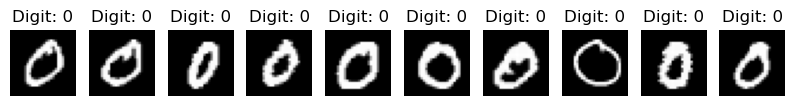

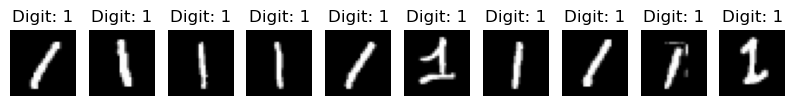

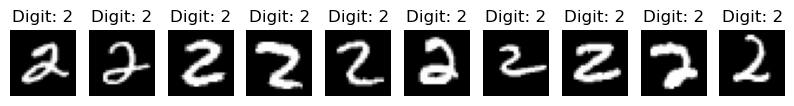

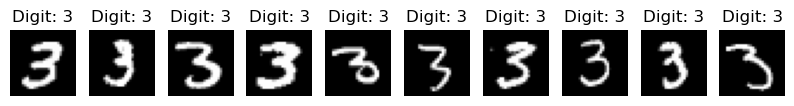

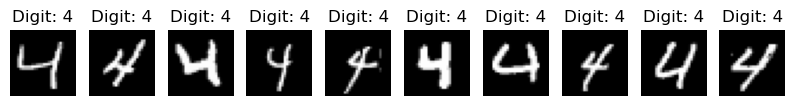

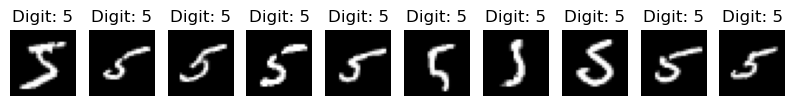

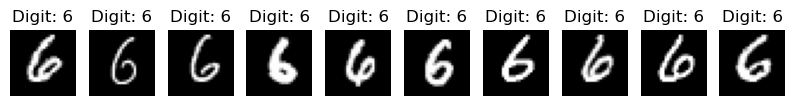

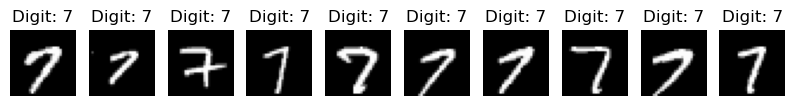

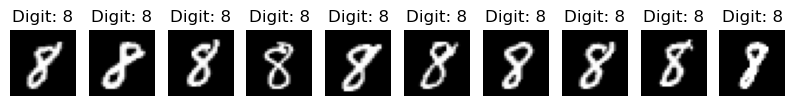

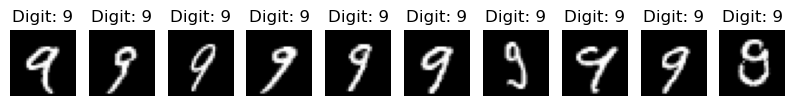

c:\Users\Akshay Patil\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


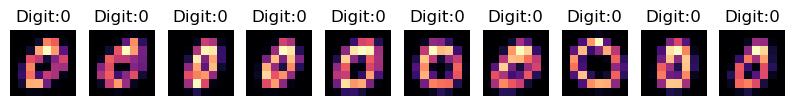

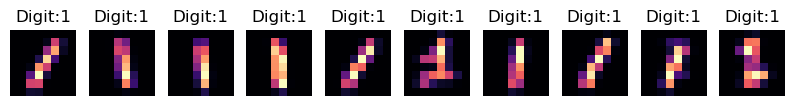

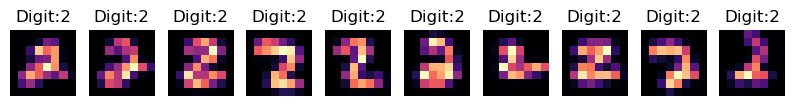

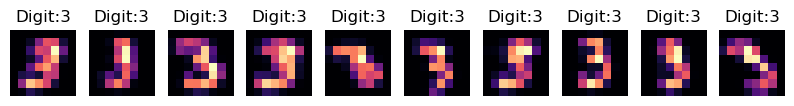

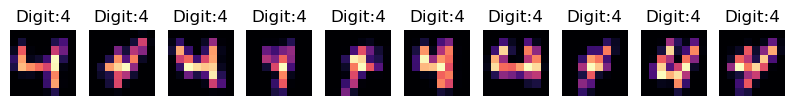

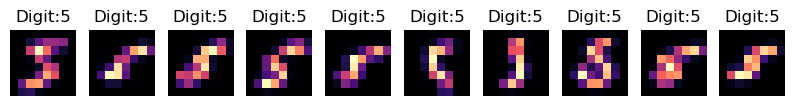

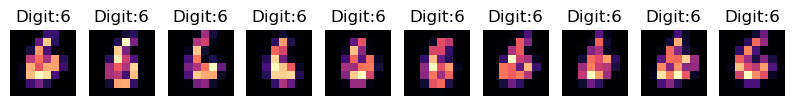

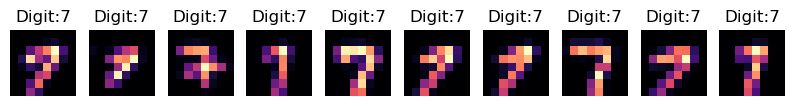

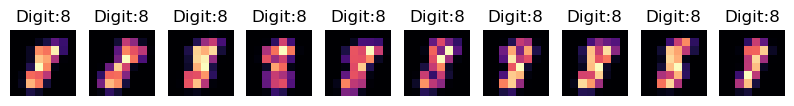

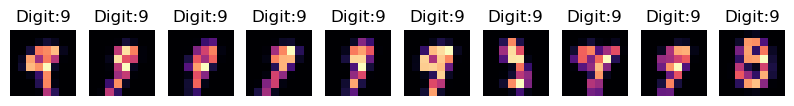

Digit zero [[0.00000000e+00 0.00000000e+00 5.02834929e-05 ... 5.04943733e-03
  2.54318312e-06 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 3.64488586e-06 ... 2.44551014e-02
  2.39711887e-05 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.95373525e-05 ... 5.52719367e-02
  4.29082453e-06 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.33822537e-04
  1.93436207e-08 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.30475596e-07 ... 1.49584173e-04
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.45087318e-07 ... 5.72852573e-04
  3.43886591e-08 0.00000000e+00]]
Digit one [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.41505166e-07
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.26532695e-02 ... 2.13737652e+00
  3.00926886e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.68420508e-04 ... 4.41504330e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00300256e-08
  0.0000000

In [3]:
# MNIST Dataset Exact Equation of the NN
# Loading the dataset
# Seperating them per class

def load_MNIST_dataset_Images(file_path): # for now trial on mnist dataset
    images = idx2numpy.convert_from_file(file_path)
    images = images.reshape(images.shape[0], -1)
    images = images.astype(np.float64)
    return images

def load_MNIST_dataset_Labels(file_path):
    labels = idx2numpy.convert_from_file(file_path)
    return labels

# Download the MNIST Dataset from Kaggle and Change this directory to your Directory
train_images_file = r"D:\Downloads Now\archive\train-images.idx3-ubyte"
train_labels_file = r"D:Downloads Now\archive\train-labels.idx1-ubyte"

mnist_images = load_MNIST_dataset_Images(train_images_file)
mnist_labels = load_MNIST_dataset_Labels(train_labels_file)

print('MNIST Images:', mnist_images)
print('MNIST Lables:', mnist_labels)


# Separating the load dataset into train labels and the train digits 

def separate_images_and_labels(images , labels , digit):
    digit_images = []
    digit_labels = []
    for image,label in zip(images,labels):
        if label == digit:
            digit_images.append(image)
            digit_labels.append(label)
    return digit_images,digit_labels

digits_to_separate = [0,1,2,3,4,5,6,7,8,9]

digit_image = {}
digit_label = {}

for digit in digits_to_separate:
    digit_image[digit], digit_label[digit] = separate_images_and_labels(mnist_images,mnist_labels,digit)

for digit in digits_to_separate:
    print('Digit', digit)
    print('Mnist Images', len(digit_image[digit]))
    print('Mnist Labels', len(digit_label[digit]))

import matplotlib.pyplot as plt

num_samples = 10 

for digit in digit_image.keys():
    sample_images = digit_image[digit][:num_samples]
    plt.figure(figsize = (10,2))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(sample_images[i].reshape(28,28), cmap = 'gray')
        plt.title(f"Digit: {digit}")
        plt.axis('off')
    plt.show()

# Resize the image to a higher accuracy and match the dimensions of the qubits

from skimage.transform import resize

def resize_images(images, new_size = (8,8)):
    resized_images = []
    for image in images:
        resized_image = resize(image.reshape(28,28), new_size)
        resized_images.append(resized_image.flatten())
    return resized_images

new_size = (8,8)

resized_digit_images = {}
for digit in digit_image.keys():
    resized_digit_images[digit] = resize_images(digit_image[digit], new_size = new_size)

for digit in digit_image.keys():
    sample_images = resized_digit_images[digit][:num_samples]
    plt.figure(figsize =(10,2))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(sample_images[i].reshape(new_size), cmap = 'magma')
        plt.title(f"Digit:{digit}")
        plt.axis('off')
    plt.show()

# Converting all the digits in to arrays

Digit_zero = []

for image in resized_digit_images[0]:
    Digit_zero_ = image
    Digit_zero.append(Digit_zero_)

Digit_zero = np.array(Digit_zero)

print('Digit zero',Digit_zero)

Digit_one = []

for image in resized_digit_images[1]:
    Digit_one_ = image
    Digit_one.append(Digit_one_)

Digit_one = np.array(Digit_one)

print('Digit one',Digit_one)

Digit_two = []

for image in resized_digit_images[2]:
    Digit_two_ = image
    Digit_two.append(Digit_two_)

Digit_two = np.array(Digit_two)

print('Digit two',Digit_two)

Digit_three = []

for image in resized_digit_images[3]:
    Digit_three_ = image
    Digit_three.append(Digit_three_)

Digit_three = np.array(Digit_three)

print('Digit three',Digit_three)

Digit_four = []

for image in resized_digit_images[4]:
    Digit_four_ = image
    Digit_four.append(Digit_four_)

Digit_four = np.array(Digit_four)

print('Digit four',Digit_four)

Digit_fifth = []

for image in resized_digit_images[5]:
    Digit_fifth_ = image
    Digit_fifth.append(Digit_fifth_)

Digit_fifth = np.array(Digit_fifth)

print('Digit fifth',Digit_fifth)

Digit_sixth = []

for image in resized_digit_images[6]:
    Digit_sixth_ = image
    Digit_sixth.append(Digit_sixth_)

Digit_sixth = np.array(Digit_sixth)

print('Digit Sixth',Digit_sixth)

Digit_seventh = []

for image in resized_digit_images[7]:
    Digit_seventh_ = image
    Digit_seventh.append(Digit_seventh_)

Digit_seventh = np.array(Digit_seventh)

print('Digit seventh',Digit_seventh)

Digit_eigth = []

for image in resized_digit_images[8]:
    Digit_eigth_ = image
    Digit_eigth.append(Digit_eigth_)

Digit_eigth = np.array(Digit_eigth)

print('Digit eigth',Digit_eigth)

Digit_nineth = []

for image in resized_digit_images[9]:
    Digit_nineth_ = image
    Digit_nineth.append(Digit_nineth_)

Digit_nineth = np.array(Digit_nineth)

print('Digit nineth',Digit_nineth)

# Digit zero to Nine grey scale matrix conversion by reshaping a row array into a (N,N) size

# Quantum Amplitude Encoding of MNIST Dataset

N = 8

Digit_zero_ = []

for i in range(len(Digit_zero)):
    Digit_zero_.append((Digit_zero[i].reshape(N**2))/np.linalg.norm(Digit_zero[i]))

Digit_one_ = []

for i in range(len(Digit_one)):
    Digit_one_.append((Digit_one[i].reshape(N**2))/np.linalg.norm(Digit_one[i]))

Digit_two_ = []

for i in range(len(Digit_two)):
    Digit_two_.append((Digit_two[i].reshape(N**2))/np.linalg.norm(Digit_two[i]))

Digit_three_ = []

for i in range(len(Digit_three)):
    Digit_three_.append((Digit_three[i].reshape(N**2))/np.linalg.norm(Digit_three[i]))

Digit_four_ = []

for i in range(len(Digit_four)):
    Digit_four_.append((Digit_four[i].reshape(N**2))/np.linalg.norm(Digit_four[i]))

Digit_five_ = []

for i in range(len(Digit_fifth)):
    Digit_five_.append((Digit_fifth[i].reshape(N**2))/np.linalg.norm(Digit_fifth[i]))

Digit_sixth_ = []

for i in range(len(Digit_sixth)):
    Digit_sixth_.append((Digit_sixth[i].reshape(N**2))/np.linalg.norm(Digit_sixth[i]))

Digit_seventh_ = []

for i in range(len(Digit_seventh)):
    Digit_seventh_.append((Digit_seventh[i].reshape(N**2))/np.linalg.norm(Digit_seventh[i]))

Digit_eigth_ = []

for i in range(len(Digit_eigth)):
    Digit_eigth_.append((Digit_eigth[i].reshape(N**2))/np.linalg.norm(Digit_eigth[i]))

Digit_nineth_ = []

for i in range(len(Digit_nineth)):
    Digit_nineth_.append((Digit_nineth[i].reshape(N**2))/np.linalg.norm(Digit_nineth[i]))


Input_state_vector_zero = np.array(Digit_zero_)
Input_state_vector_one = np.array(Digit_one_)
Input_state_vector_two = np.array(Digit_two_)
Input_state_vector_three = np.array(Digit_three_)
Input_state_vector_four = np.array(Digit_four_)
Input_state_vector_fifth = np.array(Digit_five_)
Input_state_vector_sixth = np.array(Digit_sixth_)
Input_state_vector_seventh = np.array(Digit_seventh_)
Input_state_vector_eigth = np.array(Digit_eigth_)
Input_state_vector_nineth = np.array(Digit_nineth_)

input_state_vectors = []

input_state_vectors.append(Input_state_vector_zero)
input_state_vectors.append(Input_state_vector_one)
input_state_vectors.append(Input_state_vector_two)
input_state_vectors.append(Input_state_vector_three)
input_state_vectors.append(Input_state_vector_four)
input_state_vectors.append(Input_state_vector_fifth)
input_state_vectors.append(Input_state_vector_sixth)
input_state_vectors.append(Input_state_vector_seventh)
input_state_vectors.append(Input_state_vector_eigth)
input_state_vectors.append(Input_state_vector_nineth)


M = 64
Phase_Encoded_Vectors = []
Digit_zero = Digit_zero.reshape(Digit_zero.shape[0],M)
Digit_one = Digit_one.reshape(Digit_one.shape[0],M)
Digit_two = Digit_two.reshape(Digit_two.shape[0],M)
Digit_three = Digit_three.reshape(Digit_three.shape[0],M)
Digit_four = Digit_four.reshape(Digit_four.shape[0],M)
Digit_fifth = Digit_fifth.reshape(Digit_fifth.shape[0],M)
Digit_sixth = Digit_sixth.reshape(Digit_sixth.shape[0],M)
Digit_seventh = Digit_seventh.reshape(Digit_seventh.shape[0],M)
Digit_eigth = Digit_eigth.reshape(Digit_eigth.shape[0],M)
Digit_nineth = Digit_nineth.reshape(Digit_nineth.shape[0],M)

for i in Digit_zero:
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))  

for i in Digit_one.reshape(Digit_one.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))

for i in Digit_two.reshape(Digit_two.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))

for i in Digit_three.reshape(Digit_three.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))       

for i in Digit_four.reshape(Digit_four.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))  

for i in Digit_fifth.reshape(Digit_fifth.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))  

for i in Digit_sixth.reshape(Digit_sixth.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))  

for i in Digit_seventh.reshape(Digit_seventh.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a)) 

for i in Digit_eigth.reshape(Digit_eigth.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))

for i in Digit_nineth.reshape(Digit_nineth.shape[0],M):
    a = i
    Phase_Encoded_Vectors.append(a/np.linalg.norm(a))

labels = []
for i in range(10):
    labels.append(i)

print(labels)

labels_zero = [labels[0]]*Digit_zero.shape[0]
labels_one  = [labels[1]]*Digit_one.shape[0]
labels_two  = [labels[2]]*Digit_two.shape[0]
labels_three  = [labels[3]]*Digit_three.shape[0]
labels_four  = [labels[4]]*Digit_four.shape[0]
labels_five  = [labels[5]]*Digit_fifth.shape[0]
labels_six  = [labels[6]]*Digit_sixth.shape[0]
labels_seven  = [labels[7]]*Digit_seventh.shape[0]
labels_eigth  = [labels[8]]*Digit_eigth.shape[0]
labels_nineth  = [labels[9]]*Digit_nineth.shape[0]
labels_zero = np.array(labels_zero,dtype = int)
labels_one = np.array(labels_one,dtype = int)
labels_two = np.array(labels_two,dtype = int)
labels_three = np.array(labels_three,dtype = int)
labels_four = np.array(labels_four,dtype = int)
labels_five = np.array(labels_five,dtype = int)
labels_six = np.array(labels_six,dtype = int)
labels_seven = np.array(labels_seven,dtype = int)
labels_eigth = np.array(labels_eigth,dtype = int)
labels_nineth = np.array(labels_nineth,dtype = int)

labels_new_train = np.concatenate((labels_zero,labels_one))
labels_new_train = np.concatenate((labels_new_train,labels_two))
labels_new_train = np.concatenate((labels_new_train,labels_three))
labels_new_train = np.concatenate((labels_new_train,labels_four))
labels_new_train = np.concatenate((labels_new_train,labels_five))
labels_new_train = np.concatenate((labels_new_train,labels_six))
labels_new_train = np.concatenate((labels_new_train,labels_seven))
labels_new_train = np.concatenate((labels_new_train,labels_eigth))
labels_new_train = np.concatenate((labels_new_train,labels_nineth))

# Test Dataset 
import idx2numpy
import numpy as np
from PIL import Image
import pennylane as qml

images = idx2numpy.convert_from_file(r"D:\Downloads Now\archive\\t10k-images.idx3-ubyte")# Download the MNIST Dataset from Kaggle and Change this directory to your Directory
labelss = idx2numpy.convert_from_file(r"D:\Downloads Now\archive\\t10k-labels.idx1-ubyte")

# Resize images to 32x32
images_resized = np.array([np.array(Image.fromarray(img).resize((8, 8))) for img in images])

# Normalize vectors
test_images = images_resized 

input_state_test_vectors = []


# Digit zero to Nine grey scale matrix conversion by reshaping a row array into a (N,N) size

N = 8

import torch
for i in range(len(images_resized)):
    input_state_test_vectors.append((images_resized[i].reshape(N**2,1))/np.linalg.norm(images_resized[i]))

input_state_test_vectors = np.array(input_state_test_vectors,dtype = np.float64)
input_state_test_vectors = torch.tensor(input_state_test_vectors,dtype = torch.float64)

In [4]:
# NN Model for Classification...Without the Fancy Dropout , Batch Normalziation , but that can also be done here...


class DeeperNN(nn.Module):
    def __init__(self):
        super(DeeperNN, self).__init__()
        self.fc1 = nn.Linear(64, 32)

        self.dropout1 = nn.Dropout(0)

        self.fc2 = nn.Linear(32,16)

        self.dropout2 = nn.Dropout(0)

        self.fc3 = nn.Linear(16,16)

        self.dropout3 = nn.Dropout(0)

        self.fc4 = nn.Linear(16, 32)

        self.dropout4 = nn.Dropout(0)

        self.fc5 = nn.Linear(32, 10)


    def forward(self, x):
        x = torch.relu((self.fc1(x)))
        x = self.dropout1(x)

        x = torch.relu((self.fc2(x)))
        x = self.dropout2(x)

        x = torch.relu((self.fc3(x)))
        x = self.dropout3(x)

        x = torch.relu((self.fc4(x)))
        x = self.dropout4(x)

        x = self.fc5(x)
        return x
    def get_logits(self, x):
        # Forward pass without softmax
        with torch.no_grad():
            x = torch.relu((self.fc1(x)))
            x = self.dropout1(x)
            x = torch.relu((self.fc2(x)))
            x = self.dropout2(x)
            x = torch.relu((self.fc3(x)))
            x = self.dropout3(x)
            x = torch.relu((self.fc4(x)))
            x = self.dropout4(x)
            return self.fc5(x)  # Raw logits (before softmax)



# Convert NumPy arrays to PyTorch tensors
output_state_image_vectors_tensor = torch.tensor(Phase_Encoded_Vectors, dtype=torch.float32)
normalized_reshaped_image_embeddings_tensor = torch.tensor(F.one_hot((torch.tensor(labels_new_train).long()),num_classes=10),dtype = torch.float32)

# Create a DataLoader for batching
dataset = TensorDataset(output_state_image_vectors_tensor, normalized_reshaped_image_embeddings_tensor)
train_loader = DataLoader(dataset, batch_size=64, shuffle=True)

# Initialize the model, loss function, optimizer, and scheduler
model = DeeperNN()
criterion = nn.CrossEntropyLoss() 
optimizer = optim.AdamW(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,patience=1, factor=0.5)
# scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer=optimizer,T_0=100,verbose = True)
# Training loop
num_epochs = 1000

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    average_loss = running_loss / len(train_loader)
    scheduler.step(average_loss)  # Adjust learning rate based on loss

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {average_loss:.40f}')


C:\Users\Akshay Patil\AppData\Local\Temp\ipykernel_23804\2574355628.py:57: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\utils\tensor_new.cpp:257.)
  output_state_image_vectors_tensor = torch.tensor(Phase_Encoded_Vectors, dtype=torch.float32)
C:\Users\Akshay Patil\AppData\Local\Temp\ipykernel_23804\2574355628.py:58: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  normalized_reshaped_image_embeddings_tensor = torch.tensor(F.one_hot((torch.tensor(labels_new_train).long()),num_classes=10),dtype = torch.float32)


Epoch [1/1000], Loss: 1.2163380702167176927730452007381245493889
Epoch [2/1000], Loss: 0.5818586006347559180795769862015731632710
Epoch [3/1000], Loss: 0.4167327863861248760102284904860425740480
Epoch [4/1000], Loss: 0.3476714823228209683136924468271899968386
Epoch [5/1000], Loss: 0.3088605317003182970658770045702112838626
Epoch [6/1000], Loss: 0.2832316068062650238346122932853177189827
Epoch [7/1000], Loss: 0.2632639468955332850974571101687615737319
Epoch [8/1000], Loss: 0.2489713111054350780371180462680058553815
Epoch [9/1000], Loss: 0.2373422209514992053946969008393352851272
Epoch [10/1000], Loss: 0.2272164926314150512620670951946522109210
Epoch [11/1000], Loss: 0.2187976213072790054869898312972509302199
Epoch [12/1000], Loss: 0.2124652036273085575768249100292450748384
Epoch [13/1000], Loss: 0.2044571284959311174844742708955891430378
Epoch [14/1000], Loss: 0.2002529893010886463677877600275678560138
Epoch [15/1000], Loss: 0.1941026792541813428272234887117519974709
Epoch [16/1000], Lo

KeyboardInterrupt: 

In [5]:
# Calculate Training Accuracy of the trained NN on test data
model.eval()
with torch.no_grad():
    # Convert training outputs to class predictions
    train_outputs = model(output_state_image_vectors_tensor)
    train_preds = torch.argmax(train_outputs, dim=1)
    
    # Convert one-hot labels back to class indices
    train_labels = torch.argmax(normalized_reshaped_image_embeddings_tensor, dim=1)
    
    # Calculate accuracy
    train_correct = (train_preds == train_labels).sum().item()
    train_accuracy = train_correct / len(train_labels)

print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

# Calculate Test Accuracy (using provided test vectors)
test_inputs = input_state_test_vectors.float()  # Convert to float32
test_labels = torch.tensor(labelss, dtype=torch.long)

model.eval()
with torch.no_grad():
    test_outputs = model(test_inputs.squeeze(-1))  # Remove extra dimension
    test_preds = torch.argmax(test_outputs, dim=1)
    
    test_correct = (test_preds == test_labels).sum().item()
    test_accuracy = test_correct / len(test_labels)

print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 97.75%
Test Accuracy: 96.54%


In [6]:
# Converting Relu into Lagrangian Multiplier vectors with Binary Vectors convuluted with the Weight and biased Input Vectors i.e rotated 
# input vectors... and finding it for all the 60000 vectors...
# Printing the Relu Vector of each layer of each classes vectors on which the model is trained , 60000 vectors...


def get_binary_relu_vectors(model, input_data):
    """
    Get binary ReLU vectors (1 if positive, 0 otherwise) for all samples.
    
    Args:
        model: The trained neural network model
        input_data: Tensor containing the input data (shape: [num_samples, input_dim])
        
    Returns:
        Dictionary mapping layer names to binary activation tensors
    """
    model.eval()  # Set model to evaluation mode
    
    # Dictionary to store binary ReLU activations
    binary_relu_vectors = {
        'relu1': [],
        'relu2': [],
        'relu3': [],
        'relu4': []
    }
    
    # Define hook functions to capture outputs of each FC layer
    def hook_fc1(module, inp, out):
        relu_output = F.relu(out)
        binary_activation = (relu_output > 0).float()
        binary_relu_vectors['relu1'].append(binary_activation.detach().cpu())
    
    def hook_fc2(module, inp, out):
        relu_output = F.relu(out)
        binary_activation = (relu_output > 0).float()
        binary_relu_vectors['relu2'].append(binary_activation.detach().cpu())
    
    def hook_fc3(module, inp, out):
        relu_output = F.relu(out)
        binary_activation = (relu_output > 0).float()
        binary_relu_vectors['relu3'].append(binary_activation.detach().cpu())
    
    def hook_fc4(module, inp, out):
        relu_output = F.relu(out)
        binary_activation = (relu_output > 0).float()
        binary_relu_vectors['relu4'].append(binary_activation.detach().cpu())
    
    # Register hooks on the FC layers
    hooks = []
    hooks.append(model.fc1.register_forward_hook(hook_fc1))
    hooks.append(model.fc2.register_forward_hook(hook_fc2))
    hooks.append(model.fc3.register_forward_hook(hook_fc3))
    hooks.append(model.fc4.register_forward_hook(hook_fc4))
    
    # Create a DataLoader to process the data in batches
    batch_size = 1024  # Adjust based on memory constraints
    dataset = TensorDataset(input_data)
    data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    
    # Forward pass through the entire dataset
    with torch.no_grad():
        for batch in data_loader:
            inputs = batch[0]
            model(inputs)
    
    # Remove hooks after processing
    for hook in hooks:
        hook.remove()
    
    # Concatenate binary activations for each layer
    result = {}
    for name, acts in binary_relu_vectors.items():
        result[name] = torch.cat(acts, dim=0)
    
    return result

# Usage code to extract binary ReLU vectors for all samples
binary_relu_vectors = get_binary_relu_vectors(model, output_state_image_vectors_tensor)

# Access binary vectors for each ReLU layer
binary_relu1 = binary_relu_vectors['relu1']  # Shape: [num_samples, 32]
binary_relu2 = binary_relu_vectors['relu2']  # Shape: [num_samples, 16]
binary_relu3 = binary_relu_vectors['relu3']  # Shape: [num_samples, 16]
binary_relu4 = binary_relu_vectors['relu4']  # Shape: [num_samples, 32]

# Print shapes to verify
print(f"Binary ReLU1 shape: {binary_relu1.shape}")
print(f"Binary ReLU2 shape: {binary_relu2.shape}")
print(f"Binary ReLU3 shape: {binary_relu3.shape}")
print(f"Binary ReLU4 shape: {binary_relu4.shape}")

# If you need to save these vectors
torch.save(binary_relu_vectors, 'binary_relu_vectors.pt')

print(binary_relu_vectors)

Binary ReLU1 shape: torch.Size([60000, 32])
Binary ReLU2 shape: torch.Size([60000, 16])
Binary ReLU3 shape: torch.Size([60000, 16])
Binary ReLU4 shape: torch.Size([60000, 32])
{'relu1': tensor([[0., 1., 1.,  ..., 0., 1., 1.],
        [0., 1., 1.,  ..., 1., 1., 1.],
        [0., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [0., 1., 1.,  ..., 1., 1., 1.],
        [0., 1., 1.,  ..., 1., 1., 0.],
        [0., 1., 1.,  ..., 1., 1., 0.]]), 'relu2': tensor([[0., 1., 0.,  ..., 1., 1., 1.],
        [0., 1., 0.,  ..., 1., 1., 1.],
        [0., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 0., 1.,  ..., 1., 1., 0.],
        [1., 0., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.]]), 'relu3': tensor([[0., 0., 1.,  ..., 1., 0., 1.],
        [0., 0., 1.,  ..., 1., 1., 1.],
        [0., 0., 1.,  ..., 1., 1., 1.],
        ...,
        [0., 0., 1.,  ..., 1., 1., 1.],
        [0., 0., 0.,  ..., 1., 1., 1.],
        [0., 0., 1.,  ..., 1., 1., 1.]]), 'relu4': tensor([[1., 0., 1.,  

In [7]:
binary_relu_vectors

{'relu1': tensor([[0., 1., 1.,  ..., 0., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [0., 1., 1.,  ..., 1., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 0.],
         [0., 1., 1.,  ..., 1., 1., 0.]]),
 'relu2': tensor([[0., 1., 0.,  ..., 1., 1., 1.],
         [0., 1., 0.,  ..., 1., 1., 1.],
         [0., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 0., 1.,  ..., 1., 1., 0.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]),
 'relu3': tensor([[0., 0., 1.,  ..., 1., 0., 1.],
         [0., 0., 1.,  ..., 1., 1., 1.],
         [0., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [0., 0., 1.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 1.,  ..., 1., 1., 1.]]),
 'relu4': tensor([[1., 0., 1.,  ..., 1., 0., 0.],
         [0., 0., 1.,  ..., 1., 0., 0.],
         [1., 0., 1.,  ..., 1., 0., 0.],
         ...,
         [0., 0., 1.,  ..., 0., 1., 0.],


In [8]:
# Seperating Each Class Labels 

class0relu1 = binary_relu_vectors['relu1'][:5923]
class0relu2 = binary_relu_vectors['relu2'][:5923]
class0relu3 = binary_relu_vectors['relu3'][:5923]
class0relu4 = binary_relu_vectors['relu4'][:5923]

class1relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]]
class1relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]]
class1relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]]
class1relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]]

class2relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]:Digit_zero.shape[0] + Digit_one.shape[0]+Digit_two.shape[0]]
class2relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]:Digit_zero.shape[0] + Digit_one.shape[0]+Digit_two.shape[0]]
class2relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]:Digit_zero.shape[0] + Digit_one.shape[0]+Digit_two.shape[0]]
class2relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]:Digit_zero.shape[0] + Digit_one.shape[0]+Digit_two.shape[0]]

class3relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]]
class3relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]]
class3relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]]
class3relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]]

class4relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]]
class4relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]]
class4relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]]
class4relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]]

class5relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]]
class5relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]]
class5relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]]
class5relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]]

class5relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class5relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class5relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class5relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]

class6relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class6relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class6relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]
class6relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]]

class7relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]]
class7relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]]
class7relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]]
class7relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]]

class8relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]]
class8relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]]
class8relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]]
class8relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]]

class9relu1 = binary_relu_vectors['relu1'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]+Digit_nineth.shape[0]]
class9relu2 = binary_relu_vectors['relu2'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]+Digit_nineth.shape[0]]
class9relu3 = binary_relu_vectors['relu3'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]+Digit_nineth.shape[0]]
class9relu4 = binary_relu_vectors['relu4'][Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]:Digit_zero.shape[0]+Digit_one.shape[0]+Digit_two.shape[0]+Digit_three.shape[0]+Digit_four.shape[0]+Digit_fifth.shape[0]+Digit_sixth.shape[0]+Digit_seventh.shape[0]+Digit_eigth.shape[0]+Digit_nineth.shape[0]]

In [9]:
# Ideally as per our original assumption in the paper of single Langrange multiplier vector per class i.e. as four
# layers of relu are used , it should have been four Relu vectors of convolution per class , but now they as per what we 
# found are different in unique groups , but these groups should be different for different classes to increase distingushibility.


# Assuming binary_relu_vectors contains all activations (shape: [samples, layers])
# and labels contains digit classifications (0-9) for all samples

def count_unique_groups(binary_relu_vectors, labels):
    """
    Count unique binary vector groups per class per layer
    
    Args:
        binary_relu_vectors: Dict of tensors {layer_name: tensor}
        labels: Tensor of class labels (0-9)
        
    Returns:
        Nested dictionary: counts[class][layer] = Counter
    """
    counts = defaultdict(lambda: defaultdict(Counter))
    
    for class_id in range(10):
        class_mask = labels == class_id
        
        for layer in ['relu1', 'relu2', 'relu3', 'relu4']:
            # Get activations for this class and layer
            layer_activations = binary_relu_vectors[layer][class_mask]
            
            # Convert to hashable tuples and count
            activations_tuples = [tuple(vec.tolist()) for vec in layer_activations]
            counts[class_id][layer] = Counter(activations_tuples)
            
    return counts

# Usage
unique_groups = count_unique_groups(binary_relu_vectors, labels_new_train)

# Print statistics
for class_id in range(10):
    print(f"\nClass {class_id} Unique Patterns:")
    for layer in ['relu1', 'relu2', 'relu3', 'relu4']:
        num_groups = len(unique_groups[class_id][layer])
        print(f"{layer}: {num_groups} unique vectors")


Class 0 Unique Patterns:
relu1: 2812 unique vectors
relu2: 147 unique vectors
relu3: 69 unique vectors
relu4: 589 unique vectors

Class 1 Unique Patterns:
relu1: 1499 unique vectors
relu2: 84 unique vectors
relu3: 68 unique vectors
relu4: 448 unique vectors

Class 2 Unique Patterns:
relu1: 4374 unique vectors
relu2: 169 unique vectors
relu3: 59 unique vectors
relu4: 742 unique vectors

Class 3 Unique Patterns:
relu1: 4724 unique vectors
relu2: 110 unique vectors
relu3: 22 unique vectors
relu4: 587 unique vectors

Class 4 Unique Patterns:
relu1: 3481 unique vectors
relu2: 132 unique vectors
relu3: 49 unique vectors
relu4: 327 unique vectors

Class 5 Unique Patterns:
relu1: 3878 unique vectors
relu2: 154 unique vectors
relu3: 39 unique vectors
relu4: 663 unique vectors

Class 6 Unique Patterns:
relu1: 4037 unique vectors
relu2: 137 unique vectors
relu3: 105 unique vectors
relu4: 469 unique vectors

Class 7 Unique Patterns:
relu1: 2879 unique vectors
relu2: 394 unique vectors
relu3: 117 

In [10]:
# Frequency of occurence of the unique Binary Relu vector per layer per class 

def binary_to_decimal(binary_tensor):
    """Convert binary activation patterns to decimal numbers"""
    return torch.matmul(
        binary_tensor.float(),
        2 ** torch.arange(binary_tensor.size(1)-1, -1, -1, 
                        device=binary_tensor.device).float()
    ).long()

def print_decimal_patterns(binary_relu_vectors, labels, class_names):
    """Main function to process and print patterns"""
    # Convert labels to tensor if needed
    if not isinstance(labels, torch.Tensor):
        labels = torch.tensor(labels, dtype=torch.long)
    
    # Dictionary to store decimal patterns
    decimal_patterns = defaultdict(lambda: defaultdict(dict))
    
    for class_idx, class_name in enumerate(class_names):
        # Create mask for current class
        class_mask = labels == class_idx
        
        print(f"\n{'='*50}\nClass: {class_name}\n{'='*50}")
        
        for layer in ['relu1', 'relu2', 'relu3', 'relu4']:
            # Get binary vectors for this class and layer
            layer_vectors = binary_relu_vectors[layer][class_mask]
            
            # Convert to decimal numbers
            decimals = binary_to_decimal(layer_vectors)
            
            # Get unique patterns and counts
            unique_decs, counts = torch.unique(decimals, return_counts=True)
            
            # Store patterns
            decimal_patterns[class_name][layer] = {
                'decimals': decimals,
                'unique': unique_decs,
                'counts': counts
            }
            
            # Print results
            print(f"\nLayer {layer.upper()} - {len(unique_decs)} unique patterns:")
            for dec, cnt in zip(unique_decs.tolist(), counts.tolist()):
                print(f"Decimal: {dec:8d} | Frequency: {cnt:4d} | Binary: {layer_vectors[decimals == dec][0].tolist()}")

    return decimal_patterns

# Class name mapping
class_names = [
    "Digit_Zero", "Digit_One", "Digit_Two", "Digit_Three", "Digit_Four",
    "Digit_Five", "Digit_Six", "Digit_Seven", "Digit_Eight", "Digit_Nine"
]

# Run the analysis
decimal_patterns = print_decimal_patterns(
    binary_relu_vectors=binary_relu_vectors,
    labels=labels_new_train,  # Your training labels array
    class_names=class_names
)



Class: Digit_Zero

Layer RELU1 - 1913 unique patterns:
Decimal: 51102056 | Frequency:    1 | Binary: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0]
Decimal: 55288164 | Frequency:    1 | Binary: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0]
Decimal: 55296360 | Frequency:    1 | Binary: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0]
Decimal: 57188708 | Frequency:    1 | Binary: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0]
Decimal: 57450596 | Frequency:    1 | Binary: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0,

In [ ]:
# All the unique equations given by Trained NN - for notation easiness converting the langrangian multipliers i.e. binary vectors into 
# Decimals and printing the string equations, for this trained data using the Cross Entropy Loss function 
# the NN outputs 53783 unique equations...but can be used for different loss functions as well...


def binary_to_decimal(binary_tensor):
    """Convert binary activation patterns to decimal numbers"""
    return torch.matmul(
        binary_tensor.float(),
        2 ** torch.arange(binary_tensor.size(1)-1, -1, -1, 
                        device=binary_tensor.device).float()
    ).long()

# Convert all layers to decimal representations
layer_decimals = {
    layer: binary_to_decimal(vectors)
    for layer, vectors in binary_relu_vectors.items()
}

# Create equation tuples for all samples
equation_keys = list(zip(
    layer_decimals['relu1'].tolist(),
    layer_decimals['relu2'].tolist(),
    layer_decimals['relu3'].tolist(),
    layer_decimals['relu4'].tolist()
))

# Count unique equations
equation_counter = defaultdict(int)
for key in equation_keys:
    equation_counter[key] += 1

# Generate human-readable equations
unique_equations = []
for (a1, a2, a3, a4), count in equation_counter.items():
    equation = (
        f"W4('α4={a4}' (W3('α3={a3}' (W2('α2={a2}' "
        f"(W1('α1={a1}' (W1x + b1)) + b2)) + b3)) + b4))"
    )
    unique_equations.append((equation, count))

# Sort by frequency descending
unique_equations.sort(key=lambda x: -x[1])

# Print results
print(f"Total Unique Equations: {len(unique_equations)}\n")
print("Top 10 Most Common Patterns:")
for i, (eq, cnt) in enumerate(unique_equations[:29727]):
    print(f"\n{i+1}. Occurrences: {cnt}")
    print(eq)

# Optional: Save all equations
with open("network_equations.txt", "w") as f:
    for eq, cnt in unique_equations:
        f.write(f"Count: {cnt}\n{eq}\n\n")


Total Unique Equations: 53783

Top 10 Most Common Patterns:

1. Occurrences: 45
W4('α4=2070672512' (W3('α3=15743' (W2('α2=31583' (W1('α1=3309384960' (W1x + b1)) + b2)) + b3)) + b4))

2. Occurrences: 36
W4('α4=2080371840' (W3('α3=16255' (W2('α2=64287' (W1('α1=1804733696' (W1x + b1)) + b2)) + b3)) + b4))

3. Occurrences: 35
W4('α4=2080371840' (W3('α3=16255' (W2('α2=64287' (W1('α1=1804737792' (W1x + b1)) + b2)) + b3)) + b4))

4. Occurrences: 30
W4('α4=2080371840' (W3('α3=16255' (W2('α2=64287' (W1('α1=1804999936' (W1x + b1)) + b2)) + b3)) + b4))

5. Occurrences: 28
W4('α4=2968369152' (W3('α3=10109' (W2('α2=54223' (W1('α1=1195943936' (W1x + b1)) + b2)) + b3)) + b4))

6. Occurrences: 28
W4('α4=2079978624' (W3('α3=8063' (W2('α2=47711' (W1('α1=4115340544' (W1x + b1)) + b2)) + b3)) + b4))

7. Occurrences: 27
W4('α4=2079978624' (W3('α3=16255' (W2('α2=64095' (W1('α1=4114816256' (W1x + b1)) + b2)) + b3)) + b4))

8. Occurrences: 26
W4('α4=972027648' (W3('α3=16255' (W2('α2=64479' (W1('α1=1707127808'

In [12]:
# Unique Equations Per Class ...and their correspoding frequencies of occurence...

# Function to convert binary list to decimal
def binary_list_to_decimal(bin_list):
    return sum(val * (2 ** idx) for idx, val in enumerate(reversed(bin_list)))

# Initialize dictionary for all 10 classes
class_equations = {i: [] for i in range(10)}

# Process all samples
for i in range(len(labels_new_train)):
    # Get decimal values for each layer
    a1 = binary_list_to_decimal(binary_relu_vectors['relu1'][i])
    a2 = binary_list_to_decimal(binary_relu_vectors['relu2'][i])
    a3 = binary_list_to_decimal(binary_relu_vectors['relu3'][i])
    a4 = binary_list_to_decimal(binary_relu_vectors['relu4'][i])
    
    # Create equation string
    equation = (
        f"W4('α4={a4}' (W3('α3={a3}' (W2('α2={a2}' "
        f"(W1('α1={a1}' (W1x + b1)) + b2)) + b3)) + b4))"
    )
    
    # Get class label and store equation
    cls = labels_new_train[i]
    class_equations[cls].append(equation)

# Count unique equations per class
unique_counts = {}
for cls in range(10):
    # Get all equations for this class
    equations = class_equations[cls]
    
    # Count unique equations using dictionary
    count_dict = {}
    for eq in equations:
        count_dict[eq] = count_dict.get(eq, 0) + 1
    
    unique_counts[cls] = {
        'total_samples': len(equations),
        'unique_equations': len(count_dict),
        'equation_frequencies': count_dict
    }

# Print summary
print("Class | Total Samples | Unique Equations")
print("-----|--------------|-----------------")
for cls in range(10):
    print(f"{cls:5} | {unique_counts[cls]['total_samples']:12} | {unique_counts[cls]['unique_equations']:15}")

Class | Total Samples | Unique Equations
-----|--------------|-----------------
    0 |         5923 |            5464
    1 |         6742 |            4777
    2 |         5958 |            5859
    3 |         6131 |            5981
    4 |         5842 |            5347
    5 |         5421 |            5361
    6 |         5918 |            5805
    7 |         6265 |            5870
    8 |         5851 |            4808
    9 |         5949 |            4694


In [13]:
unique_counts[0]['equation_frequencies']

{"W4('α4=3119297536.0' (W3('α3=10109.0' (W2('α2=21455.0' (W1('α1=1832951936.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=971798528.0' (W3('α3=10111.0' (W2('α2=21471.0' (W1('α1=1707909120.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=3119314944.0' (W3('α3=16255.0' (W2('α2=31711.0' (W1('α1=1866476928.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=3119313920.0' (W3('α3=10045.0' (W2('α2=15327.0' (W1('α1=1296344448.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=3119265792.0' (W3('α3=10109.0' (W2('α2=21455.0' (W1('α1=1732878464.0' (W1x + b1)) + b2)) + b3)) + b4))": 2,
 "W4('α4=2968369152.0' (W3('α3=10045.0' (W2('α2=54219.0' (W1('α1=1732815232.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=971798528.0' (W3('α3=12159.0' (W2('α2=29663.0' (W1('α1=1866840320.0' (W1x + b1)) + b2)) + b3)) + b4))": 1,
 "W4('α4=955037632.0' (W3('α3=10109.0' (W2('α2=64479.0' (W1('α1=1195942016.0' (W1x + b1)) + b2)) + b3)) + b4))": 2,
 "W4('α4=3119265792.0' (W3('α3=12095.0' (W2('α2=62431.0' (W1('α1=18

In [14]:
# Generate weighted average equations for each class based on the number of counts
# of the equation, this is our exact equation for this NN architecture using Cross Entropy as loss function...
# There may be other techniques used for getting the single equation per class , but this is our vanilla model
# Note - The equation printed is taking the relu binary vector in to corresponding decimal number , but for
# getting the exact equation per class , one can use symbolic representations of the input vector x and 
# multiply with the corresponding matirces and add biases and convulute relu binary as per the NN circuit , to get the
# exact equations of transformations , sympy is one such library , but for symbolic computation is very slow , 
# but one can do that...


class_equations = []

for cls in range(10):
    # Get class data
    total = unique_counts[cls]['total_samples']
    frequencies = unique_counts[cls]['equation_frequencies']
    
    # Create weighted terms
    equation_terms = []
    for eq, count in frequencies.items():
        weight = count / total
        equation_terms.append(f"{weight:.6f}*\n\t({eq})")
    
    # Build full equation string
    class_eq = f"Class {cls} Equation:\n" + " +\n".join(equation_terms)
    class_equations.append(class_eq)

# Print all class equations
for i, eq in enumerate(class_equations):
    print(f"\n{'='*60}\nDigit Class {i} Weighted Average Equation\n{'='*60}")
    print(eq)
    print(f"\nTotal Terms: {len(unique_counts[i]['equation_frequencies'])}")
    print(f"Sample Count: {unique_counts[i]['total_samples']}")



Digit Class 0 Weighted Average Equation
Class 0 Equation:
0.000169*
	(W4('α4=3119297536.0' (W3('α3=10109.0' (W2('α2=21455.0' (W1('α1=1832951936.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000169*
	(W4('α4=971798528.0' (W3('α3=10111.0' (W2('α2=21471.0' (W1('α1=1707909120.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000169*
	(W4('α4=3119314944.0' (W3('α3=16255.0' (W2('α2=31711.0' (W1('α1=1866476928.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000169*
	(W4('α4=3119313920.0' (W3('α3=10045.0' (W2('α2=15327.0' (W1('α1=1296344448.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000338*
	(W4('α4=3119265792.0' (W3('α3=10109.0' (W2('α2=21455.0' (W1('α1=1732878464.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000169*
	(W4('α4=2968369152.0' (W3('α3=10045.0' (W2('α2=54219.0' (W1('α1=1732815232.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000169*
	(W4('α4=971798528.0' (W3('α3=12159.0' (W2('α2=29663.0' (W1('α1=1866840320.0' (W1x + b1)) + b2)) + b3)) + b4))) +
0.000338*
	(W4('α4=955037632.0' (W3('α3=10109.0' (W2('α2=64479.0' (W

Now imagine implementing it for all the Generative AI applications , we will get the exact functions of NN of LLM , and all other models , 
Once done for LLM , for every output token class we will have exact equation of classification , and we will get the exact function
and we can understand and relate it to other classes or branches of AI , like Logic , planning etc.
Also this work can be extended to Bellmann equations of Reinforcement Learning....